# Assignment

## Motivation
- What is your dataset?
- Why did you choose this/these particular dataset(s)?
- What was your goal for the end user's experience?

## Data importing and cleaning

Something about how we gather the data, and stats from the dataset.

Here below are some general modules and functions which will be used to gather the data and analyze it throughout the notebook.

In [32]:
# -*- coding: utf-8 -*-
% matplotlib inline
import re, math, string, nltk, random, io, xml, os, wordcloud, urllib2, json, warnings
import numpy as np
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
import pandas as pd
from scipy import sparse
import matplotlib.pyplot as plt
# What is this? from matplotlib import cm
from scipy.misc import imread
from wordcloud import WordCloud, ImageColorGenerator
from collections import defaultdict, Counter
import networkx as nx
from __future__ import division
import community as community
from PIL import Image
from fa2 import ForceAtlas2
#from IPython.display import clear_output
import sys
reload(sys)
sys.setdefaultencoding('utf8')

We have three datasets. Books, movies and webpages.

### Data importing and cleaning: Wikipages

From the fan created [Lord of the Rings wikia](http://lotr.wikia.com/wiki/Main_Page), where information about all sorts of creatures from Middle Earth can be found. We gathered the names of all characters listed [here](http://lotr.wikia.com/wiki/Category:The_Lord_of_the_Rings_Characters) into a CSV file. That character list was then used to collect the respective wikipages. In addition to collecting those pages, we found the Race and Culture each character belongs to. For characters where that information was missing, we had to add that information by ourself.

In [2]:
df_csv = pd.read_csv("./names_lotr_underscored.csv")

def finding_race(df_names):
    """
     finding race in each .txt file for characters in the data frames with the wiki names. 
    """
    for charac in range(len(df_names.Names)):
        filename = "./characters/" + df_names.Names[charac] + '.txt'
        #print(df_names.Names[charac])
        f = open(filename)
        raw = f.read()
        text =raw.split("|")
        regex = r"race\s*=\s*"
        for z in text:
            if re.search(regex, z, re.IGNORECASE):
                x = z
                a = x.replace('[[','')
                b = a.replace(']]','')
                c = b.replace('race','')
                d = c.replace('=','')
                #print(type(d))
                e = d.split('\\n')
                #print(e)
                g = e[0]
                h = g.lstrip() 
                
                df_names.race[charac] = h
    return df_names

def finding_culture(df_names):
    """
     finding race in each .txt file for characters in the data frames with the wiki names. 
    """
    for charac in range(len(df_names.Names)):
        filename = "./characters/" + df_names.Names[charac] + '.txt'
        ##print(df_names.Names[charac])
        f = open(filename)
        raw = f.read()
        text =raw.split("|")
        regex = r"culture\s*=\s*"
        for z in text:
            if re.search(regex, z, re.IGNORECASE):
                w1 = z
                w2 = w1.replace(r"[ ](?=[ ])|[^-_,A-Za-z0-9 ]+", '')
                w3= w2.replace(r"^[A-Z][\w\s]+[?.!]$", '')
                w4 = w3.replace(r'''(?P<lastname>[-\w]+[^,\s] (?P<firstname>[-\w ]+)''', '' )  
                w5 = w4.replace('[[','')
                w6 = w5.replace(']]','')
                w7 = w6.replace('culture','')
                w8 = w7.replace('=','')
                ##print(type(d))
                #head, sep, tail = w8.partition('<ref>')             
                #g= head.replace('{{', '')
                #k= g.replace('}}', '')
                #l= k.replace(',', '')
                #h = g.replace(']','')
                ##print(e)
                #g = e[0]
                #h = g.lstrip() 
                #e = head.split('\\n')
                
                k = w8.lower()
                #print g
                if "valar" in k:
                    df_names.culture[charac] = "Valar"
                elif "maiar" in k:
                    df_names.culture[charac] = "Maiar"
                elif "maiar" and "istari" in k:
                    df_names.culture[charac] = "Maiar-Istari"
                elif "elves" and "sindar" in k:
                    df_names.culture[charac] = "Elves-Sindar"                
                elif "elves" and "silvan" in k:
                    df_names.culture[charac] = "Elves-Silvan"                     
                elif "elves" and "noldor" in k:
                    df_names.culture[charac] = "Elves-Noldor"
                elif "elves" and "rivendell" in k:
                    df_names.culture[charac] = "Elves-Rivendell"
                elif "elves" and "lothlorien" in k:
                    df_names.culture[charac] = "Elves-Lothlorien"
                elif "elves" and "grey" and "havens" in k:
                    df_names.culture[charac] = "Elves-Grey_Havens"
                elif "dwarves" and "erebor" in k:
                    df_names.culture[charac] = "Dwarves-Erebor"
                elif "dwarves" and "moria" in k:
                    df_names.culture[charac] = "Dwarves-Moria"
                elif "dwarves" and "blue" and "mountains" in k:
                    df_names.culture[charac] = "Dwarves-Blue Mountains"
                elif "men" and "gondor" in k:
                    df_names.culture[charac] = "Men-Gondor" 
                elif "men" and "rohan" in k:
                    df_names.culture[charac] = "Men-Rohan"
                elif "men" and "north" in k:
                    df_names.culture[charac] = "Men-North"
                elif "men" and "beorning" in k:
                    df_names.culture[charac] = "Men-Beorning"
                elif "men" and "bree" in k:
                    df_names.culture[charac] = "Men-Bree"
                elif "hobbits" and "shire" in k:
                    df_names.culture[charac] = "Hobbits-Shire"
                elif "hobbits" and "buckland" in k:
                    df_names.culture[charac] = "Hobbits-Buckland"
                elif "hobbit" and "bree" in k:
                    df_names.culture[charac] = "Hobbits-Bree"
                elif "rohirrim" in k:
                    df_names.culture[charac] = "Rohirrim"
                elif "orc" and "mordor" in k:
                    df_names.culture[charac] = "Orcs-Mordor"
                elif "wizards" in k:
                    df_names.culture[charac] = "Wizards"
                elif "black" and "uruks" in k:
                    df_names.culture[charac] = "Black-Uruks"
                elif "uruk" and "hai" in k:
                    df_names.culture[charac] = "Black-Uruks"
                elif "dúnedain" in k:
                    df_names.culture[charac] = "Dúnedain"
                elif "dwarves" and "iron" and "hill" in k:
                    df_names.culture[charac] = "Dwarves-Iron Hill"
                else:
                    #df_names.culture[charac] = k   
                    k1 = k.split('\\n')
                    #k2 = k1[0]
                    #k3 = k1.lstrip()
                    if (len(k1) <= 2):
                        df_names.culture[charac] = "Unknown"
                    else: 
                        df_names.culture[charac] = k1
    return df_names

def enrich_data(df_names):
    df_names['race'] = ""
    df_names['culture'] = ""
    # Finding all races & culture and saving it in df_names.
    df_names = finding_race(df_names)
    df_names = finding_culture(df_names)
    
    # Manualy Adding race & culture to the ones that were missing it.
    #Race:
    df_names['race'][19] = "Unknown" #Tom_Bombadil
    df_names['race'][7] = "Hobbits" # Angelica_Baggins
    df_names['race'][5] = "Horses" # Asfaloth
    df_names['race'][148] = "Unknown" # Witch-king's_Fellbeast
    df_names['race'][146] = "Horses" # Windfola, horse that carried Éowyn
    df_names['race'][145] = "Hobbits"  # Widow_Rumble, Widow Rumble looked after Hamfast Gamgee after the War of the Ring when his son Sam moved from Bagshot Row to Bag End.
    df_names['race'][144] = "Hobbits"  #Will_Whitfoot, was the Mayor of Michel Delving at the time of the War of the Ring.
    #df_names['race'][143] = "Unknown" # Watcher_in_the_Water = Unknown # was a horrifying and mysterious beast with many tentacles living in a stagnant pool or lake near the Westgate of Moria.
    df_names['race'][58] = "Ents"
    df_names['race'][140] = "Hobbits" # Daddy_Twofoot
    df_names['race'][137] = "Hobbits" # Everard_Took
    df_names['race'][119] = "Orc" # Orc of Mordor in the Tower of Cirith Ungol who was killed by Shagrat in the battle over Frodo's Mithril Shirt.
    df_names['race'][117] = "Hobbits" # Sancho_Proudfoot.
    df_names['race'][111] = "Unknown" # tree,  (possibly a Huorn)
    df_names['race'][94] = "Men" # Hurin_(Warden_of_the_Keys), man of Gondor during the events of the War of the Ring.
    df_names['race'][93] = "Hobbits" # Hugo_Bracegirdle, he was notorious for borrowing books from Bilbo Baggins.
    df_names['race'][88] = "Men" # Mat_Heathertoes. died in the year 3019 of the Third Age, along with two other Men and two Hobbits.
    df_names['race'][87] = "Horses" # Hasufel, large dark grey horse, originally belonging to Gárulf
    #df_names['race'][75] = "Unknown" # Goldberry, Unknown,  The River-daughter, was the wife of Tom Bombadil in the Old Forest at the edge of Buckland.
    df_names['race'][59] = "Horses" # Firefoot, Firefoot was a horse of Rohan, possibly of Mearas descent, ridden by Eomer.
    df_names['race'][57] = "Ents" # Fimbrethil, Treebeard's long-lost wife.
    df_names['race'][34] = "Hobbits" # Wilcombe_(Jolly)_Cotton, Hobbit of the shire.
    df_names['race'][31] = "Hobbits" # Carl_Cotton
    df_names['race'][107] = "Great Eagles"
    df_names['race'][100] = "Great Eagles"

    #Culture:
    #creating this in order to have a more consistent culture name for all charaters, also some of them were missing the culture 
    # therefore needed to add them manually
    df_names['culture'][7] = "Hobbits-Shire"
    df_names['culture'][148] = "Unknown"
    df_names['culture'][145] = "Hobbits-Shire"
    df_names['culture'][5] = "Horses of Rivendell"
    df_names['culture'][11] = "Ents of Fangorn Forest"
    df_names['culture'][127] = "Daughter of Ungoliant"
    df_names['culture'][129] = "Orcs-Mordor"
    df_names['culture'][140] = "Hobbits-Shire"
    df_names['culture'][144] = "Hobbits-Shire"
    df_names['culture'][147] = "Ringwraith"
    df_names['culture'][146] = "Horses of Rivendell"
    df_names['culture'][34] = "Hobbits-Shire"
    df_names['culture'][35] = "Teleri"
    df_names['culture'][31] = "Hobbits-Shire" # Carl_Cotton
    df_names['culture'][44] ="River-Folk"
    df_names['culture'][137] = "Hobbits-Shire" # Everard_Took
    df_names['culture'][95] = "Rohirric"
    df_names['culture'][57] = "Unknown"
    df_names['culture'][59] = "Unknown"
    df_names['culture'][62] = "Elves-Falmari"
    df_names['culture'][68] = "Drúedain of the Drúadan Forest"
    df_names['culture'][69] = "Elves-Noldor"
    df_names['culture'][70] = "Durin's-Folk"
    df_names['culture'][70] = "Durin's-Folk"
    df_names['culture'][76] = "River-Folk"
    df_names['culture'][73] = "River-Folk"
    df_names['culture'][78] = "Orcs-Morannon"
    df_names['culture'][82] = "Eagles-Valinor"
    df_names['culture'][87] = "Unknown"
    df_names['culture'][88] = "Men-Bree"
    df_names['culture'][93] = "Hobbits-Shire"
    df_names['culture'][94] = "Men-Gondor"
    df_names['culture'][117] = "Hobbits-Shire"
    df_names['culture'][119] = "Orcs-Mordor"
    df_names['culture'][120] = "Elves-Noldor"
    df_names['culture'][107] = "Eagles-Eyrie"
    df_names['culture'][100] = "Eagles-Valinor"
    df_names['culture'][108] ="Black Númenóreans"
    df_names['culture'][132] ="Men-Mountains"
    
    return df_names


df_names = enrich_data(df_csv)

### Creation of the network: Wikipages

As mentioned above, after collecting all of those names, we created several functions which were first used to save the Wikipages, and then to gather the connections between the characters' wikipages, finding links between them using regular expressions and by using them creating connections.

In [3]:
def get_wikipedia_page(page_name):
    
    """
    input : 
    - the name of a wikipedia page
    output : 
    - the json containing the content of the wikipedia page
    """
    baseUrl = "http://lotr.wikia.com/api.php?"
    action =  "action=query"
    title = "titles="+page_name
    content = "prop=revisions&rvprop=content"
    dataFormat = "format=json"
    query = "%s%s&%s&%s&%s" % (baseUrl,action,title,content,dataFormat)

    rep = urllib2.urlopen(query)
    rep2 = rep.read()
    jsonRep = json.loads(rep2)
    return jsonRep

def save_all_wiki_page(dataset, folder_name):
    """
    input : 
    - data_frame = the data frame containing the list of names.
    - folder_name = the folder name where to put the extracted wikipedia pages from the list of names in the dataframe
    output :
    - boolean : True. This function create .txt files in the folder named with folder_name
    
    """
    for name in dataset['Names']:
        page = get_wikipedia_page(name)
        filename = folder_name + "/" + name + '.txt'
        f = io.open(filename,'w',encoding="utf-8")
        f.write(unicode(json.dumps(page, ensure_ascii=False)))
        f.close
    return ('The .txt files for each wikipage have been created')

def get_hyperlinks_in_wikipage(dataset, path_folder):
    """
    input :
    - dataset : the dataframe object containing the list of characters.
    - path_folder : the path to the folder where the wikipedia pages in .txt are present
    output :
    - a dict object containing all the hyperlinks contained in each wikipedia pages.
    Keys of the dict are the characters names and the Values are the hyperlinks contained in the page
    """
    dict_link = {}
    for i in range(len(dataset.Names.sort_values())):
        character = dataset.Names.sort_values().iloc[i]
        filename = path_folder + '/' + character + '.txt'
        f = io.open(filename,'r',encoding="utf-8").read()
        regex = ".*?\[\[(.*?)[\]\|]"
        links = re.findall(regex,f)
        dict_link[character]=links
    return dict_link

def get_list_of_names(dataset):
    """
    input : 
    - dataset : the dataset containing the list of names.
    output :
    - an array containing the list of names present in the dataset. The underscores are removed
    and replaced with a space.
    """
    list_of_names = []
    for l in dataset['Names'].sort_values():
        m = l.replace("_", " ")
        list_of_names.append(m)
    return list_of_names

def find_links(list_of_links, list_of_names):
    """
    input : 
    - list_of_links : the list of links present in one wikipedia apge
    - list_of_name : the list of the characters names in the story
    output :
    - a list containing the list of names of the characters who appear on the wikipage.
    """
    match = []
    for l in list_of_links:
        if l.encode('utf-8') in list_of_names:
            if l.encode('utf-8') not in match:
                match.append(l.encode('utf-8'))
    return match

def create_relation(dataset, path_folder):
    """
    input : 
    - dataset : the dataset containing information about the characters.
    - path_folder : the path to the folder where the wikipages in .txt are present
    output :
    - a dict object with characters name as Keys and 
    the name of the others characters present in his wikipage as Values.
    """
    list_of_names = get_list_of_names(dataset)
    dict_links = get_hyperlinks_in_wikipage(dataset, path_folder)
    relationship = {}
    for character, list_of_links in dict_links.items():
        new_character = character.replace("_"," ")
        relationship[new_character] = find_links(list_of_links,list_of_names)
    return relationship
    
def create_edges_for_one_character(character, list_of_relations):
    """
    input : 
    - character : the name of one character
    - list_of_relations: a list of name
    output :
    - a list containing link from the character to every name in the list of relations
    """
    edges = []
    for l in list_of_relations:
        edges.append([character, l])
    return edges
    
def create_edges_wiki(dict_relation):
    """
    input :
    - dict_relation : a dict object with character name as Keys and 
    the name of the other characters present in his wikipage as Values
    output :
    - a array containing a list of edges which are a link between 2 characters as contained in the input dict.
    """
    list_of_edges = []
    for character, relations in dict_relation.items():
        for edge in create_edges_for_one_character(character, relations):
            list_of_edges.append(edge)
    return list_of_edges

In [4]:
save_all_wiki_page(df_names,"./characters")

'The .txt files for each wikipage have been created'

We create the network, using the functions above, which will be analyzed in part three of the assignment.

### Data importing and cleaning: The books
Through googling, we found the three volumes of the Lord of the Rings on text format. [Lord of the Rings: The Fellowship of the Ring](https://archive.org/stream/TheLordOfTheRing1TheFellowshipOfTheRing/The+Lord+Of+The+Ring+1-The+Fellowship+Of+The+Ring_djvu.txt). However, with the books being a bit messy and unmanouverable, we had to clean them and order into a list of chapters, making it much easier to manipulate with code. The first step was to read the books in.

In [5]:
#Read in all the volumes. Remove all occurencese of \n (newline).
with open('./LOTR1_book_CLEAN.txt', 'r') as myfile:
    LOTR1_book=myfile.read()
with open('./LOTR2_book_CLEAN.txt', 'r') as myfile:
    LOTR2_book=myfile.read()
with open('./LOTR3_book_CLEAN.txt', 'r') as myfile:
    LOTR3_book=myfile.read()

    

After reading the books in, we utilized some keywords to split the three volumes into their receptive chapters. Each of the volumes is split into two books, with the word BOOK appearing capetalized in the textfile. On top of that, the keyword Chapter was used to split the books into chapters.

In [6]:

#The three volume's each consist of two Books, which we need to split by to be able to split by chapter.
#Moreover, volumes two and three include some junk at the front which we throw out.
LOTR1_book = LOTR1_book.split('BOOK')
LOTR2_book = LOTR2_book.split('BOOK')
LOTR2_book.pop(0)
LOTR3_book = LOTR3_book.split('BOOK')
LOTR3_book.pop(0)

#Now we can split each book by chapters.
LOTR1_prologue_chapters = LOTR1_book[0].split('Chapter')
LOTR1_book1_chapters = LOTR1_book[1].split('Chapter')
LOTR1_book2_chapters = LOTR1_book[2].split('Chapter')
LOTR2_book1_chapters = LOTR2_book[0].split('Chapter') #Rétt
LOTR2_book2_chapters = LOTR2_book[1].split('Chapter') #Rétt
LOTR3_book1_chapters = LOTR3_book[0].split('Chapter')
LOTR3_book2_chapters = LOTR3_book[1].split('Chapter')
#Again we need to pop out some junk at the beginning.
LOTR1_book1_chapters.pop(0)
LOTR1_book2_chapters.pop(0)
LOTR2_book1_chapters.pop(0)
LOTR2_book2_chapters.pop(0)
LOTR3_book1_chapters.pop(0)
LOTR3_book2_chapters.pop(0)

' VI\n\n\n'

Now we have a list containing all of the chapters in the three Lord of the Rings volumes, as well as the prologue. We used them to create three lists containing every chapter in each volume, as well as one list who will rule them all. 

In [7]:
#Then we add up everything to have the three volumes on a nice format.
LOTR_volume1 = LOTR1_book1_chapters+LOTR1_book2_chapters
LOTR_volume2 = LOTR2_book1_chapters+LOTR2_book2_chapters
LOTR_volume3 = LOTR3_book1_chapters+LOTR3_book2_chapters
All_chapter = LOTR1_prologue_chapters + LOTR_volume1 + LOTR_volume2 + LOTR_volume3

### Data importing and cleaning: The movies
We accessed the transcript of the three movies (in extended edition), which contained a list of the characters and their respective lines in each movies. The datased contained three columns, the names of each character, the lines they said in each movie, and the movie that respective line was said.

In [8]:
# -*- coding: utf-8 -*-
import math 
import pandas as pd

df_script = pd.read_csv("./lotr_scripts.csv")

def split_in_three_movie(dataframe):
    list_lotr1 = []
    list_lotr2 = []
    list_lotr3 = []
    for row in dataframe.iterrows():
        movie = row[1].movie
        name_split = row[1].char.split()
        name = ""
        for element in name_split:
            if element in ['VOICE', 'VOICEOVER', 'OVER','SHOUT']:
                continue
            else:
                name += element + " "   
        name = name.rstrip()
        if "The Fellowship of the Ring" in movie:
            list_lotr1.append((name, row[1].dialog))
        elif "The Two Towers" in movie:
            list_lotr2.append((name, row[1].dialog))
        elif "The Return of the King" in movie:
            list_lotr3.append((name, row[1].dialog))
    return list_lotr1,list_lotr2,list_lotr3

def create_dict_for_dialogues(list_of_dialogues):
    unique_names = []
    for element in list_of_dialogues:
        if element[0] not in unique_names:
            unique_names.append(element[0])
    dict_of_dialogues = {}
    for name in unique_names:
        dict_of_dialogues[name] = ""
    for element in list_of_dialogues:
        if not(type(element[1]) is float):
            dict_of_dialogues[element[0]] = dict_of_dialogues[element[0]] + element[1]+ ". "
    return dict_of_dialogues

def create_files_for_characters_dialogues(folder_name, dict_name):
    for name, dialogues in dict_name.items():
        filename = folder_name + "/" + name + '.txt'
        f = io.open(filename,'w')
        f.write(unicode(dialogues))
        f.close
    return True

def generate_dialog_file(filename, dest_directory):
    dialogue = get_dialogues_for_movie_V2(filename)
    dialogue_cleaned = clean_dialogues_list(dialogue)
    lotr_dict = create_dict_for_dialogues(dialogue_cleaned)
    create_files_for_characters_dialogues(dest_directory, lotr_dict)
    return True


Here we create a dictionary for the three movies.

In [9]:
LOTR1_list,LOTR2_list,LOTR3_list =  split_in_three_movie(df_script)

dict1 = create_dict_for_dialogues(LOTR1_list)
dict2 = create_dict_for_dialogues(LOTR2_list)
dict3 = create_dict_for_dialogues(LOTR3_list)

### Creation of the network: The books

After cleaning the books, we used the chapter splits to link together characters who appeared in the chapters together.

In [10]:
def create_list_of_character():
    df_perso = pd.read_csv("./cleaned_name.csv")
    liste_of_names = []
    for row in df_perso.iterrows():
        name = row[1].Names
        liste_of_names.append(name)
    return liste_of_names

liste_of_names2 = create_list_of_character()

In [11]:
def look_for_connection_in_book(list_of_characters, book):
    connection_chapter = []
    for chapter in book:
        people_in_chapter = []
        for character in list_of_characters:
            if character in chapter:
                people_in_chapter.append(character)
                continue
        connection_chapter.append(people_in_chapter)
    return connection_chapter


In [12]:
new_network1 = look_for_connection_in_book(liste_of_names2,LOTR_volume1)
new_network2 = look_for_connection_in_book(liste_of_names2,LOTR_volume2)
new_network3 = look_for_connection_in_book(liste_of_names2,LOTR_volume3)
new_network4 = look_for_connection_in_book(liste_of_names2,All_chapter)

Here we are connecting the characters in the chapters together, by creating edges between them and thus structuring the network.

In [13]:

def create_edges_book(list_of_names_per_chapter):
    list_of_edges = []
    for chapter in list_of_names_per_chapter:
        sub_list = []
        n = len(chapter)
        i = 0
        if n == 1:
            sub_list.append((chapter[i],chapter[i]))
        else:
            while i < n:
                j = i + 1
                while j < n:
                    sub_list.append((chapter[i],chapter[j]))
                    j += 1
                i += 1
        list_of_edges.append(sub_list)
    return list_of_edges

def cleaning_edges(list_of_edges):
    cleaned_edges = []
    dict_edges = {}
    for chapter in list_of_edges:
        for edge in chapter:
            if len(cleaned_edges) == 0:
                cleaned_edges.append(edge)
                dict_edges[edge] = 1
            elif edge in cleaned_edges:

                dict_edges[edge] += 1
            else:
                count = 0
                for element in cleaned_edges:
                    if edge[1] in element[0]:
                        if edge[0] in element[1]:
                            dict_edges[element] += 1
                            break
                        else:
                            continue
                    count += 1
                if (count == len(cleaned_edges)):
                    cleaned_edges.append(edge)
                    dict_edges[edge] = 1    
    return dict_edges
            
            

def build_network(dict_of_edges_weighted):
    G = nx.Graph()
    for edge, weight in dict_of_edges_weighted.items():
        node1 = edge[0].decode('utf-8').encode('ascii', 'replace')
        node2 = edge[1].decode('utf-8').encode('ascii', 'replace')
        G.add_edge(node1,node2, weight = weight)
    return G

def create_taille(graph):
    l = []
    for element in graph.nodes():
        l.append(graph.degree(element, weight='weight')*100)
    return l

In [14]:
edges1 = create_edges_book(new_network1)
edges2 = create_edges_book(new_network2)
edges3 = create_edges_book(new_network3)
edges_all  = create_edges_book(new_network4)

In [15]:
weighted_edges1 = cleaning_edges(edges1)
weighted_edges2 = cleaning_edges(edges2)
weighted_edges3 = cleaning_edges(edges3)
weighted_edges_all = cleaning_edges(edges_all)

## Basic stats. 



- Write about your choices in data cleaning and preprocessing
- Write a short section that discusses the dataset stats (here you can recycle the work you did for Project


## Creation of the graph: Wikipages

Write something interesting

In [16]:
relation_lotr = create_relation(df_names, './characters')

In [17]:
# Something messed up
G = nx.DiGraph()
list_of_nodes = relation_lotr.keys()
G.add_nodes_from(list_of_nodes)
list_of_edges = create_edges_wiki(relation_lotr)
G.add_edges_from(list_of_edges)

In [18]:
def graphcreator(graph,key):
    forceatlas2 = ForceAtlas2(
                              # Behavior alternatives
                              outboundAttractionDistribution=False,  # Dissuade hubs
                              linLogMode=False,  # NOT IMPLEMENTED
                              adjustSizes=False,  # Prevent overlap (NOT IMPLEMENTED)
                              edgeWeightInfluence=1.0,

                              # Performance
                              jitterTolerance=1.0,  # Tolerance
                              barnesHutOptimize=True,
                              barnesHutTheta=1.2,
                              multiThreaded=False,  # NOT IMPLEMENTED

                              # Tuning
                              scalingRatio=2.0,
                              strongGravityMode=False,
                              gravity=25.0, #this gravity allows us to have a better vizualisation.

                              # Log
                              verbose=True)
    #defining the nodes positions using forceAtlas #Switch G
    positions = forceatlas2.forceatlas2_networkx_layout(graph, pos=None, iterations=4000)
    list_size = create_taille(graph)
    plt.figure(1,figsize=(50,50))
    nx.draw(graph,pos=positions, with_labels=key, font_size=30, node_size=list_size)
    plt.show()

100%|██████████| 4000/4000 [00:02<00:00, 1435.29it/s]


('BarnesHut Approximation', ' took ', '0.54', ' seconds')
('Repulsion forces', ' took ', '1.79', ' seconds')
('Gravitational forces', ' took ', '0.03', ' seconds')
('Attraction forces', ' took ', '0.03', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.15', ' seconds')


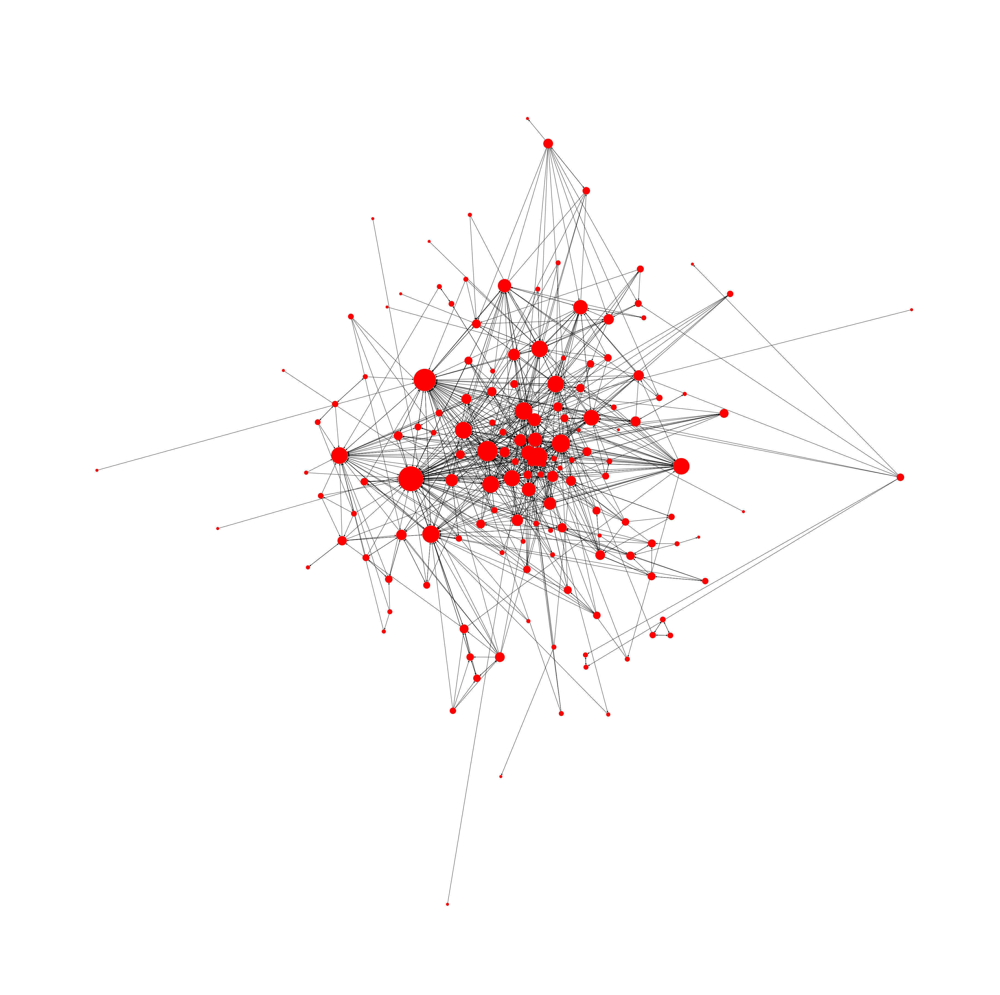

In [19]:
graphcreator(G,False)

## Creation of the graph: The books

Write something interesting

In [20]:
#G1 represents the network in The Fellowship of the Ring.
G1 = build_network(weighted_edges1)
#G2 represents the network in The Two Towers
G2 = build_network(weighted_edges2)
#G3 represents the network in The Return of the King.
G3 = build_network(weighted_edges3)
#G4 represents them all (including the prologue).
G4 = build_network(weighted_edges_all)

100%|██████████| 4000/4000 [00:01<00:00, 2238.39it/s]


('BarnesHut Approximation', ' took ', '0.45', ' seconds')
('Repulsion forces', ' took ', '0.94', ' seconds')
('Gravitational forces', ' took ', '0.03', ' seconds')
('Attraction forces', ' took ', '0.07', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.13', ' seconds')


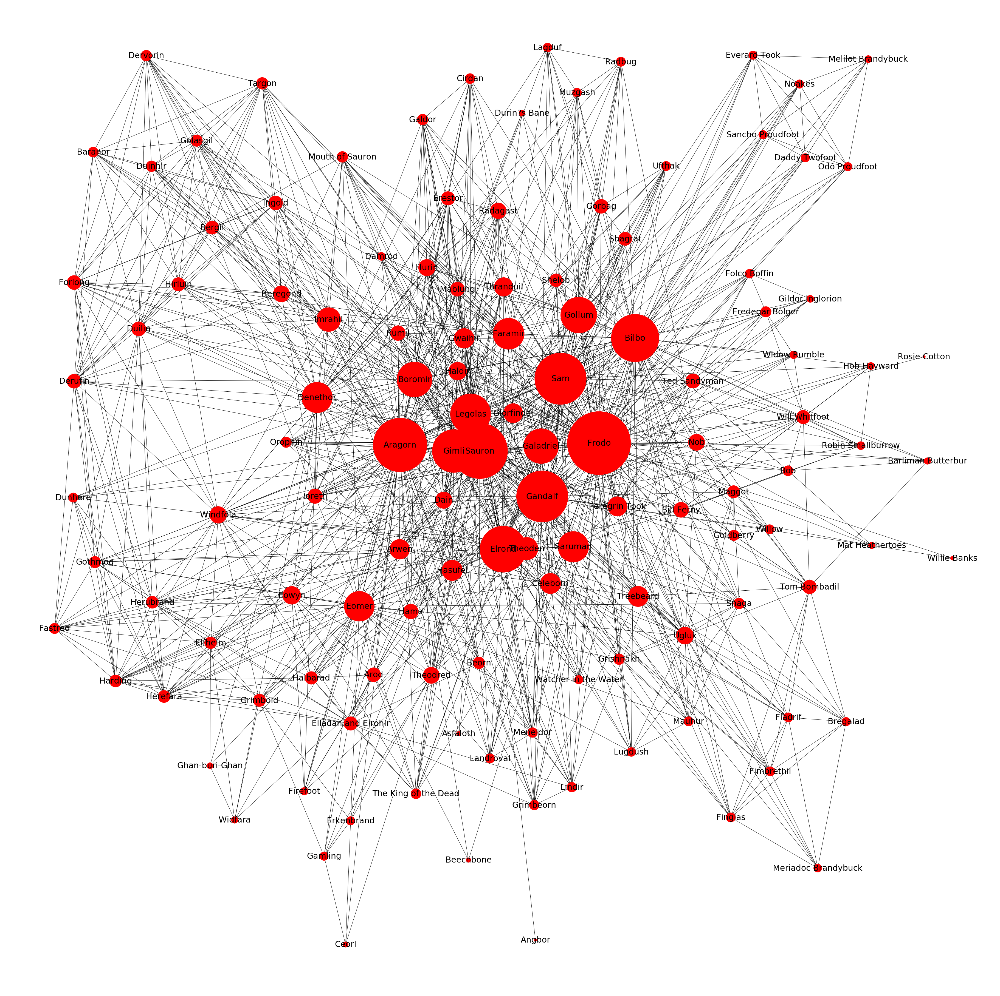

In [27]:
graphcreator(G4,True)

## Graph statistics: The wikipages
We need to make these plots a little smallerk, and possibly plotting about the in and out degree.

##### This method: 
- Explain the overall idea
- Analysis step 1
- - explain what you're interested in:Most connected person
- - explain the tool: In and out degree
- - apply the tool: Code
- - discuss the outcome: Text
- Analysis step 2
- - explain what you're interested in
- - explain the tool
- - apply the tool
- - discuss the outcome
- Analysis step 3,
... and so on until the analysis is done

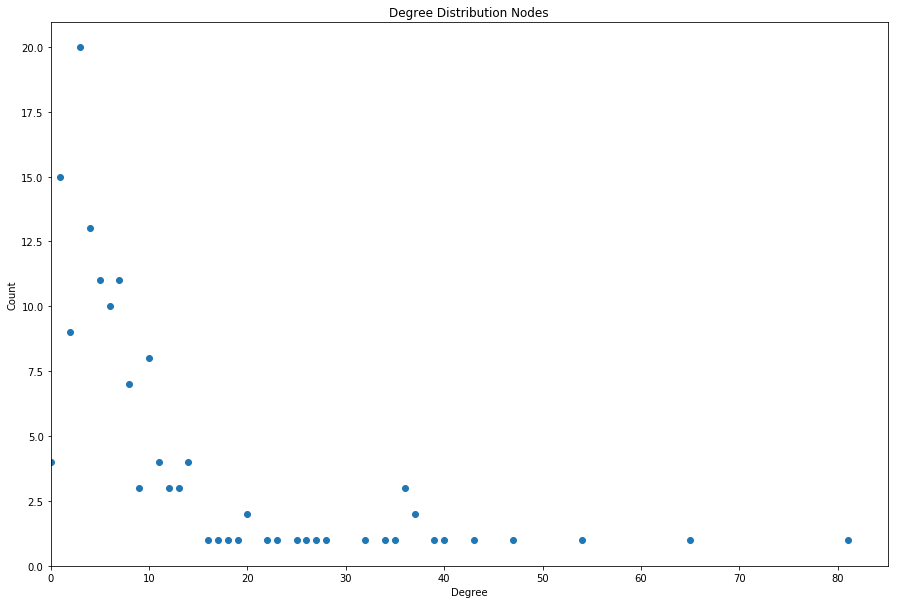

In [67]:
# Average degree of the erdos renyi:
degrees_G_ER = [val for (node,val) in G.degree()]

#Degree distributions:
ER_deg_dist = {"bin_edge" : [],"val_counts" : []}

for num, val in Counter(degrees_G_ER).items():
    ER_deg_dist["bin_edge"].append(num)
    ER_deg_dist["val_counts"].append(val)

# this is for the degree distribution graph.
degrees = sorted(dict(G.degree()).values())
plt.rcParams["figure.figsize"] = [15,10]
plt.title('Degree Distribution Nodes')
plt.plot(ER_deg_dist["bin_edge"],ER_deg_dist["val_counts"],'o')
plt.ylabel('Count')
plt.xlabel('Degree')
plt.ylim(ymin=0)
plt.xlim(xmin=0)
plt.show()


Degree distribution of the wikipages graph. Write something about it, what is interesting, what can we learn from it.

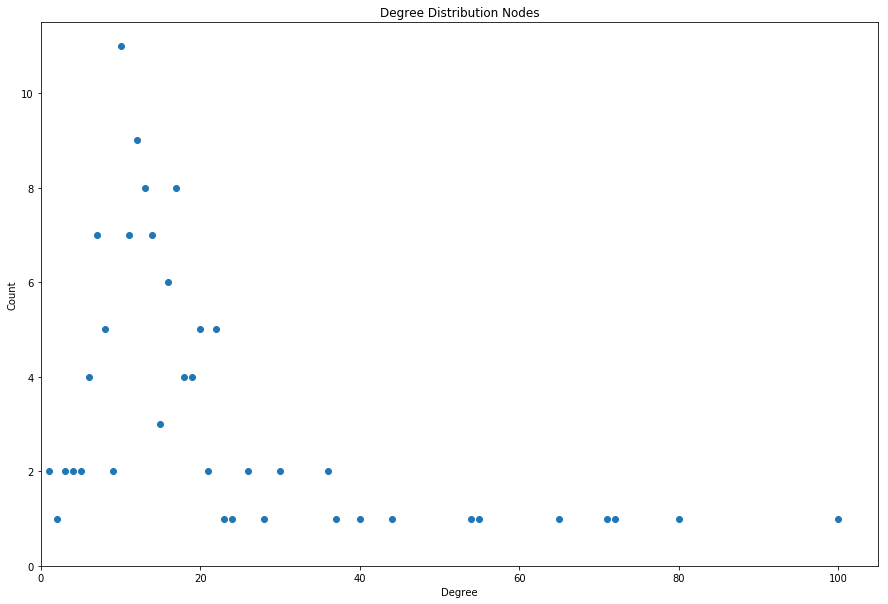

In [68]:
# Average degree of the erdos renyi:
degrees_G_ER = [val for (node,val) in G4.degree()]

#Degree distributions:
ER_deg_dist = {"bin_edge" : [],"val_counts" : []}

for num, val in Counter(degrees_G_ER).items():
    ER_deg_dist["bin_edge"].append(num)
    ER_deg_dist["val_counts"].append(val)

# this is for the degree distribution graph.
degrees = sorted(dict(G.degree()).values())
plt.rcParams["figure.figsize"] = [15,10]
plt.title('Degree Distribution Nodes')
plt.plot(ER_deg_dist["bin_edge"],ER_deg_dist["val_counts"],'o')
plt.ylabel('Count')
plt.xlabel('Degree')
plt.ylim(ymin=0)
plt.xlim(xmin=0)
plt.show()


Degree distribution of the graph for the books. Write something about it, what is interesting, what can we learn from it.

What differences are there.

In [108]:
def centrality_function(graph,string):
    deg = nx.degree_centrality(graph)
    eig = nx.eigenvector_centrality(graph)
    bet = nx.betweenness_centrality(graph)
    clo = nx.closeness_centrality(graph)
    #Top 10 degree centrality but with the values for other centralities added.
    deg_df = pd.DataFrame.from_dict([deg])
    eig_df = pd.DataFrame.from_dict([eig])
    bet_df = pd.DataFrame.from_dict([bet])
    clo_df = pd.DataFrame.from_dict([clo])
    info_df = pd.DataFrame.from_dict([deg, eig, bet, clo])
    info_df = pd.DataFrame.transpose(info_df)
    info_df.columns = ['Degree', 'Eigenvector', 'Betweenness', 'Closeness']
    return info_df.sort_values(string, ascending = False)[:10]

ordered_by_degree = centrality_function(G,'Degree')
ordered_by_degree

,Degree,Eigenvector,Betweenness,Closeness
Frodo Baggins,0.536424,0.319142,0.127368,0.537397
Gandalf,0.430464,0.319651,0.090186,0.526649
Saruman,0.357616,0.229127,0.065191,0.480519
Meriadoc Brandybuck,0.311258,0.169330,0.066694,0.475315
Peregrin Took,0.284768,0.142856,0.040758,0.447831
Legolas,0.264901,0.278774,0.022613,0.461973
Samwise Gamgee,0.258278,0.187342,0.059831,0.461973
Gimli,0.245033,0.289369,0.012782,0.457161
Galadriel,0.245033,0.239478,0.013472,0.441820
Éomer,0.238411,0.135866,0.034111,0.405115


## Graph statistics: The wikipages

##### This method: 
- Explain the overall idea
- Analysis step 1
- - explain what you're interested in:Most connected person
- - explain the tool: In and out degree
- - apply the tool: Code
- - discuss the outcome: Text
- Analysis step 2
- - explain what you're interested in
- - explain the tool
- - apply the tool
- - discuss the outcome
- Analysis step 3,
... and so on until the analysis is done

In [122]:
ordered_by_degree_G4 = centrality_function(G4,'Degree')
ordered_by_degree_G4

,Degree,Eigenvector,Betweenness,Closeness
Frodo,0.806452,0.287918,0.239157,0.832215
Aragorn,0.645161,0.245515,0.127684,0.729412
Sauron,0.580645,0.234415,0.115977,0.704545
Bilbo,0.572581,0.221139,0.078483,0.700565
Gandalf,0.524194,0.196827,0.075936,0.673913
Sam,0.443548,0.184852,0.037110,0.635897
Elrond,0.435484,0.187274,0.036970,0.635897
Boromir,0.354839,0.163696,0.022867,0.607843
Denethor,0.322581,0.151366,0.027681,0.596154
Gimli,0.298387,0.161267,0.009338,0.587678


## Tools, theory and analysis
- Talk about how you've worked with text, including regular expressions, unicode, etc.
- Describe which network science tools and data analysis strategies you've used, how those network science measures work, and why the tools you've chosen are right for the problem you're solving.
- How did you use the tools to understand your dataset?

##### This method: 
- Explain the overall idea
- Analysis step 1
- - explain what you're interested in:Most connected person
- - explain the tool: In and out degree
- - apply the tool: Code
- - discuss the outcome: Text
- Analysis step 2
- - explain what you're interested in
- - explain the tool
- - apply the tool
- - discuss the outcome
- Analysis step 3,
... and so on until the analysis is done

### Statistics, connections, e.t.c.

Seen above. Order our stuff.

### Communities

Added later

## Text analysis

When analysing the text, various functions were created for various reasons
- TF-IDF: TF-IDF, er Term Frequency-Inverse Document Frequency in full, calculates the frequency of word occurences in a certain document, as well as how frequently it appears in other documents (chapters for us). The term frequence is simply computed by counting how frequently a certain word is compared to other words in that particular chapter, generally a very low number. The inverse document frequency is computed by dividing the number of documents with the number of documents containin that particular word. Before computing TF-IDF we had to remove stopwords and some other special characters irrelevant to our analysis, as well as making sure all words were only lowercase so that words at beginning of centences would be rated equally with other words.
- Sentiment analysis: Sentiment analysis is used calculate the sentiment in text. Various different sentimental databases exist, but we used [this one](https://journals.plos.org/plosone/article/file?type=supplementary&id=info:doi/10.1371/journal.pone.0026752.s001), used previously in this course. The average sentimental score in that database is 5.xx, and it includes a total of 10222 words. Words not included in the database were removed from texts, since the sentimental score of a text is found by computing the average of every word in that text block.
- Wordclouds: Wordclouds represent visually the term frequency of analyzed data.

In [33]:
#Functions we need for the TFIDF calculations
cachedStopWords = stopwords.words("english")

#Counts the words in a document or something. Used in get_doc.
def countWords(sent):
    count = 0
    words = word_tokenize(sent)
    for word in words:
        count += 1
    return count

#Removes unwanted characters for the TFIDF calculation.
def remove_special_characters(string):
    #start_time = time.time()
    #Removes the \n from the downloaded txt. I did it already but why not again.
    stripped = string.replace('\n', '') 
    #Removes commas, and punctiation but keeps hyphens.
    stripped = re.sub('[^\w\s{P}-]','',string)
    #Make everything lowercase. All the stopwords are in lowercase.
    stripped = stripped.lower()
    #Remove stopwords. Need to do that before removing parentheses.
    stripped = ' '.join([word for word in stripped.split() if word not in cachedStopWords])
    #Removes characters, not present in the list. Maybe I want to remove numbers?
    stripped = re.sub('[ ](?=[ ])|[^-_,A-Za-z0-9 ]+', '', stripped)
    #Remove numbers
    stripped = re.sub(r'[0-9]+', '', stripped) 
    #Removes underscores (should do that in the line before.)
    stripped = re.sub('_','',stripped)
    #All whitespace characters become a single whitespace.
    stripped = re.sub('\s+',' ',stripped)
    #Possibly I want to stem?
    stripped = stripped.strip()
    #print("Removing special characters took", time.time() - start_time, "to run")

    return stripped

def text_fixer(text):
    text_fixed = []
    for i in range(len(text)):
        if text[i] != '':
            text_fixed.append(text[i])
        
    return text_fixed

def get_doc(sent,cleantext):
    #start_time = time.time()
    doc_info = []
    i = 0
    for sent in cleantext:
        i += 1
        count = countWords(sent)
        temp = {'doc_id' : i, 'doc_length' : count}
        doc_info.append(temp)
    #print("Doc_info", time.time() - start_time, "to run")
    return doc_info

def calc_frequency(sents):
    #start_time = time.time()
    i = 0
    freqDict_list = []
    for sent in sents:
        i += 1
        freqDict = {}
        words = word_tokenize(sent)
        for word in words:
            #word = word.lower()
            if word in freqDict:
                freqDict[word] += 1
            else:
                freqDict[word] = 1
            temp = {'doc_id': i, 'freqDict' : freqDict}
        freqDict_list.append(temp)
    #print("Frequency Calculations", time.time() - start_time, "to run")
    return freqDict_list

def calculateTF(doc_info,freqDict_list):
    #start_time = time.time()
    TF_scores = []
    for tempDict in freqDict_list:
        id = tempDict['doc_id']
        for k in tempDict['freqDict']:
            temp = {'doc_id' : id,
                   'TF_scores' : float(tempDict['freqDict'][k])/float(doc_info[id-1]['doc_length']),
                   'key': k}
            TF_scores.append(temp)
    #print("Calculatin TF", time.time() - start_time, "to run")
    return TF_scores

def calculateITF(doc_info,freqDict_list):
    #start_time = time.time()
    IDF_scores = []
    counter = 0
    for dict in freqDict_list:
        counter += 1
        for k in dict['freqDict'].keys():
            count = sum([k in tempDict['freqDict'] for tempDict in freqDict_list])
            temp = {'doc_id' : counter, 
                    'IDF_scores' : math.log(len(doc_info)/count), 
                    'key' : k}
            
            IDF_scores.append(temp)
    #print("Calculating ITF", time.time() - start_time, "to run")
    return IDF_scores

def calculateTFIDF(TF_scores,IDF_scores):
    #start_time = time.time()
    TFIDF_scores = []
    for j in IDF_scores:
        for i in TF_scores:
            if j['key'] == i['key'] and j['doc_id'] == i['doc_id']:
                temp = {'doc_id' : j['doc_id'],
                       'TFIDF_scores' : j['IDF_scores']*i['TF_scores'],
                       'key' : i['key']}
        TFIDF_scores.append(temp)
    #print("TFIDF Calculatin", time.time() - start_time, "to run")
    return TFIDF_scores

#Puts all the functions above together into one super short one.
def TFIDF_generator(text):
    text_sents_clean = [remove_special_characters(s) for s in text] #Strengjaformat
    text_fixed = text_fixer(text_sents_clean)
    docinfo = get_doc(text_fixed,text_fixed)
    freqDict_list = calc_frequency(text_fixed)
    TF_scores = calculateTF(docinfo,freqDict_list)
    IDF_scores = calculateITF(docinfo,freqDict_list)
    TFIDF_scores = calculateTFIDF(TF_scores,IDF_scores)
    return TFIDF_scores



Functions used for sentimental analysis.

In [34]:
warnings.filterwarnings("ignore")

# Remove stop words and punctuation and tokenize 
#Removes unwanted characters for the TFIDF calculation.
def remove_special_characters_sent(string):
    #start_time = time.time()
    #Removes the \n from the downloaded txt. I did it already but why not again.
    stripped = string.replace('\n', '') 
    #Removes commas, and punctiation but keeps hyphens.
    stripped = re.sub('[^\w\s{P}-]','',string)
    #Make everything lowercase. All the stopwords are in lowercase.
    stripped = stripped.lower()
    #Remove stopwords. Need to do that before removing parentheses.
    #stripped = ' '.join([word for word in stripped.split() if word not in cachedStopWords])
    #Removes characters, not present in the list. Maybe I want to remove numbers?
    stripped = re.sub('[ ](?=[ ])|[^-_,A-Za-z0-9 ]+', '', stripped)
    #Removes underscores (should do that in the line before.)
    stripped = re.sub('_','',stripped)
    #All whitespace characters become a single whitespace.
    stripped = re.sub('\s+',' ',stripped)
    #Possibly I want to stem?
    stripped = stripped.strip()
    #print("Removing special characters took", time.time() - start_time, "to run")
    return stripped


# counter to count the number of lines that have been processed
counter = 0

wordrank = defaultdict(float)
path = 'file.txt'
with open(path) as f:
    for line in f:
        counter += 1
        
        # Skippin the first 4 lines.
        if counter > 4:
            line = line.split()
            word = line[0]  # get the word from the line
            wordavg = float(line[2]) # get the word happiness average
            wordrank[word] = wordavg
    
#Mitt estimate happiness
def calcSentiment(tokens,wordlist):
    
    sentiment_score = [] # an array that contains the average happyness values of the tokens
    
    for token in tokens:
        # only include the words that can be found in the data set
        if token in wordlist: 
            sentiment_score.append(wordlist[token])
            
    # If no word in the tokens array is found in the dataset then we return 0
    if len(sentiment_score) == 0:
        return None
    else : 
        return np.mean(sentiment_score)

wordlist = dict()
for i, line in enumerate(open('file.txt', 'r')):
    if i > 3:
        data = line.strip().split('\t')
        # read the word and happiness_avg into a dict.
        wordlist[data[0].lower()] = float(data[2])
        
def calcSentiment2(tokens):
    sentiment = 0.0
    for token in tokens:
        t = token.lower()
        if t in wordlist:
            sentiment += wordlist[t]
    sentiments = sentiment / len(tokens)
    return sentiments


def textTokenizer(text):
    """
    input : 
    - text which has been processed with the text cleaner.
    output :
    - tokenized text
    """
    WordsTokenized = []
    for i in range(len(text)):
        WordsTokenized.append(word_tokenize(text[i]))
    return WordsTokenized

def sentimentCalculator(chapters):
    text_sents_clean = [remove_special_characters_sent(s) for s in chapters]
    tokenizedText = textTokenizer(text_sents_clean)
    sentiment = []
    for i in range(len(tokenizedText)):
        sentiments = calcSentiment(tokenizedText[i],wordrank)
        sentiment.append(sentiments)
        
    return sentiment, tokenizedText, text_sents_clean

Functions used to create wordclouds.

In [89]:
# Creates a string consisting of all words in the TF-IDF, with each word repeated according to its frequency
def generateWordcloudString(TFIDF_scores):
    newlist = sorted(TFIDF_scores, key=lambda k: k['TFIDF_scores'],reverse=True)
    result = ""
    for word in range(len(TFIDF_scores)):
    #Skoða skölunina.
        result += (TFIDF_scores[word]['key'] + ' ')*int(round(TFIDF_scores[word]['TFIDF_scores']*250)) 
    return result

def generateWordcloudStringCharacters(TFIDF_scores):
    newlist = sorted(TFIDF_scores, key=lambda k: k['TFIDF_scores'],reverse=True)
    result = ""
    for word in range(len(TFIDF_scores)):
        result += (TFIDF_scores[word]['key'] + ' ')*int(round(TFIDF_scores[word]['TFIDF_scores'])) 
    return result


# Generates the word cloud
#Might want to enlargen the title word size.
def generateWordcloud(string, title,picture):
    got_mask = imread(picture)
    image_colors = ImageColorGenerator(got_mask)
    wordcloud = WordCloud(width=1920, height=1080, background_color="white", mode="RGBA", mask=got_mask).generate(string)
    plt.figure(figsize=(10,10))
    plt.imshow(wordcloud.recolor(color_func=image_colors, random_state=3))
    plt.title(title,)
    plt.axis('off')
    plt.show()
    

### Text analysis: The books

First of all, the TF-IDF method was utilized, to create wordclouds for each chapter. Note that due to the incredible amount of words in each chapter, the term frequency for each word was quite low, and to generate a usable string for the wordcloud, the TF-IDF score had to be scaled. A list with the name of every chapter was created, making it easier to manouver through the wordclouds.

In [39]:
#Búa til lista yfir kaflaheitin.
lotr_chapter = ['A Long-expected Party','The Shadow of the Past','Three is Company',
                'A Short Cut to Mushrooms','A Conspiracy Unmasked','The Old Forest',
                'In the House of Tom Bombadil','Fog on the Barrow-downs','At the Sign of the Prancing Pony',
                'Strider','A Knife in the Dark','Flight to the Ford','Many Meetings','The Council of Elrond',
                'The Ring goes South','A Journey in the Dark','The Bridge of Khazad-dum','Lothlorien',
                'The Mirror of Galadriel','Farewell to Lorien','The Great River','The Breaking of the Fellowship',
                'The Departure of Boromir','The Riders of Rohan','The Uruk-hai','Treebeard',
                'The White Rider','The King of the Golden Hall','Helm\'s Deep','The Road to Isengard',
                'Flotsam and Jetsam','The Voice of Saruman','The Palantir','The Taming of Smeagol',
                'The Passage of the Marshes','The Black Gate is Closed','Of Herbs and Stewed Rabbit',
                'The Window on the West','The Forbidden Pool','Journey to the Cross-roads',
                'The Stairs of Cirith Ungol','Shelob\'s Lair','The Choices of Master Samwise',
                'Minas Tirith','The Passing of the Grey Company','The Muster of Rohan','The Siege of Gondor',
                'The Ride of the Rohirrim','The Battle of the Pelennor Fields','The Pyre of Denethor',
                'The Houses of Healing','The Last Debate','The Black Gate Opens','The Tower of Cirith Ungol',
                'The Land of Shadow','Mount Doom','The Field of Cormallen','The Steward and the King',
                'Many Partings','Homeward Bound','The Scouring of the Shire','The Grey Havens']

This below used for the chapter wordcloud.

In [42]:

TFIDF_Everychapter = TFIDF_generator(All_chapter)

print("TF-IDF calculations completed.")

TypeError: cannot concatenate 'str' and 'float' objects

In [47]:
dol = collections.defaultdict(list)
for d in TFIDF_Everychapter:
   k = d["doc_id"]
   dol[k].append(d)

We also generated a wordcloud for every single chapter in the volumes. Included here are the wordclouds for the chapters in the first volume, where the chapters with both the highest and lowest sentiment scores were found to be.

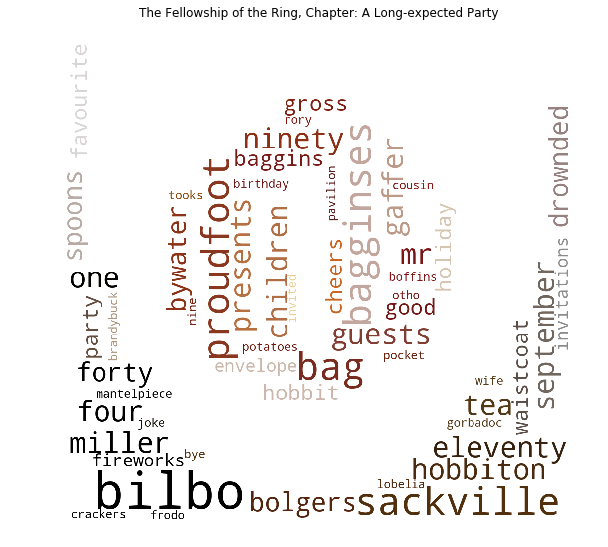

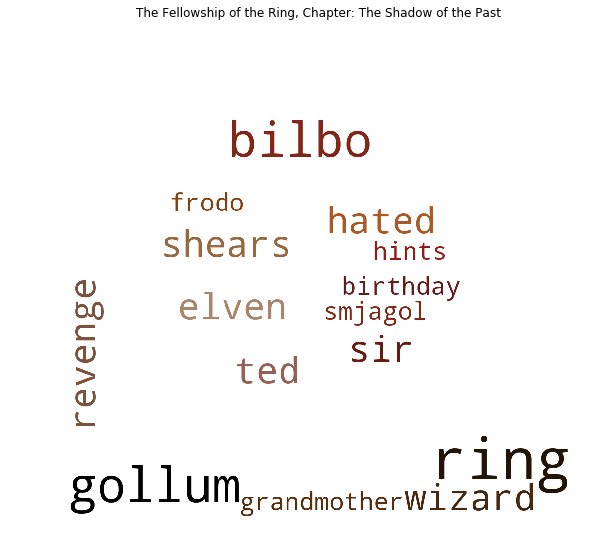

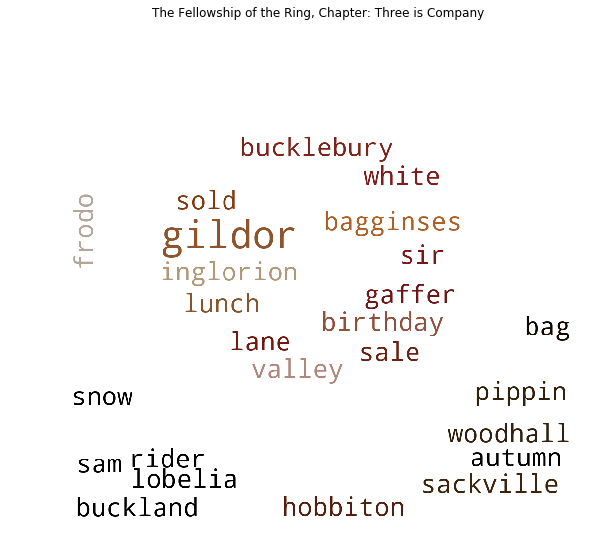

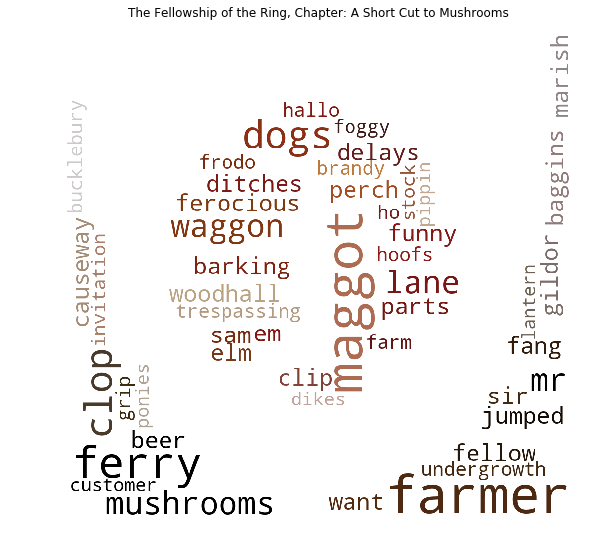

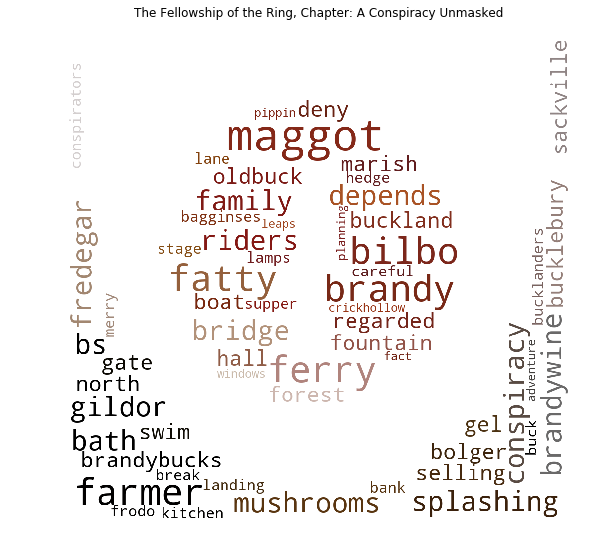

...

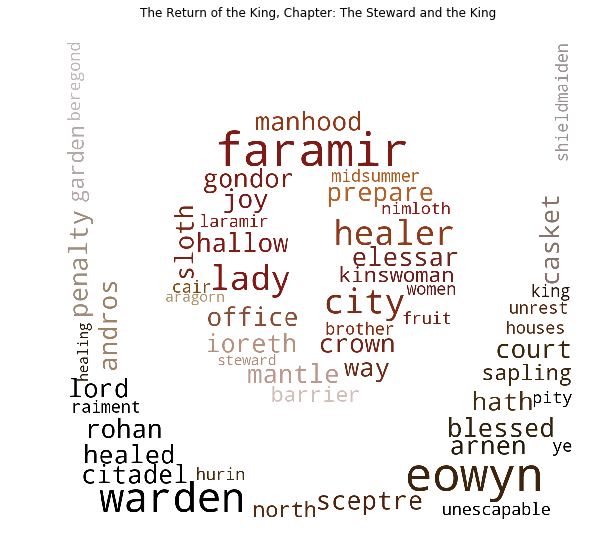

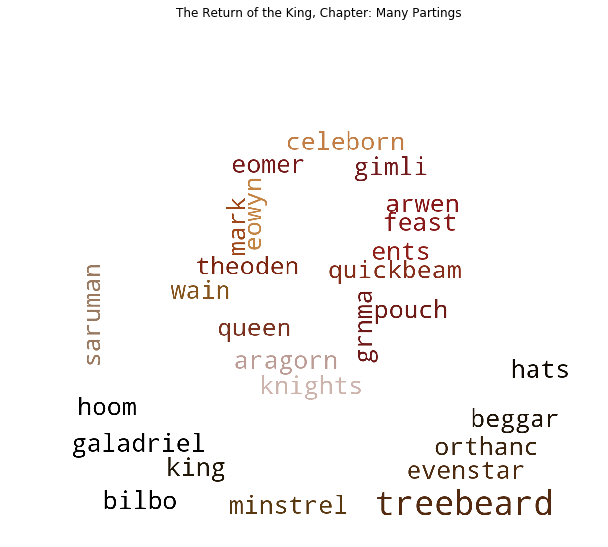

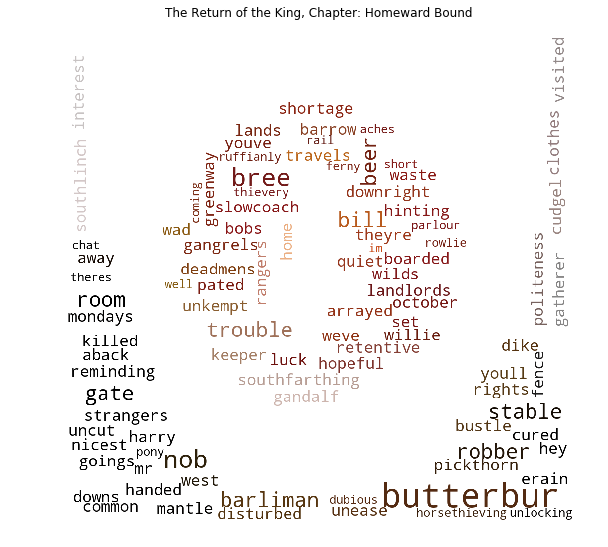

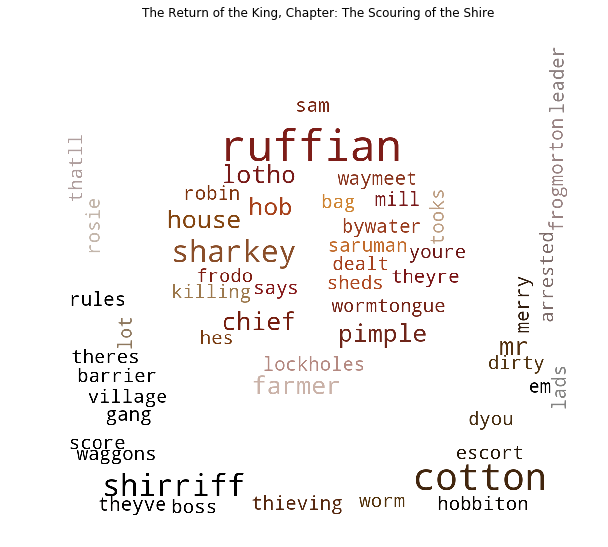

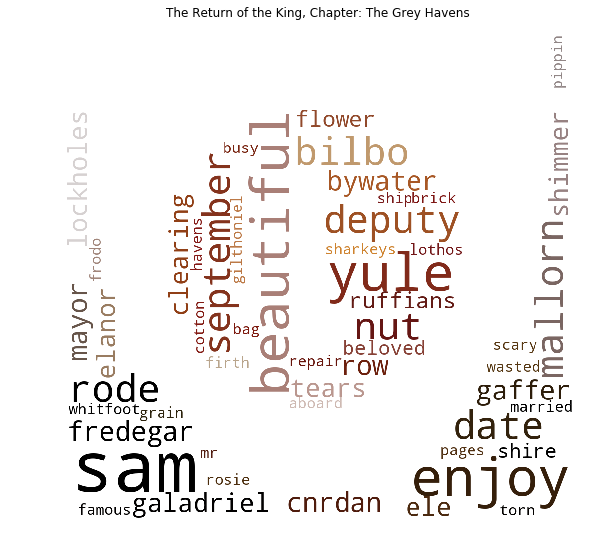

In [91]:
for i in range(6,28):
    #Generates the wordcloud
    result = generateWordcloudString(dol[i])
    generateWordcloud(result,'The Fellowship of the Ring, Chapter: '+lotr_chapter[i-6],'./images/sauron.jpg')
for i in range(28,49):
    result = generateWordcloudString(dol[i])
    generateWordcloud(result,'The Two Towers, Chapter: '+lotr_chapter[i-6],'./images/sauron.jpg')
for i in range(49,68):
    result = generateWordcloudString(dol[i])
    generateWordcloud(result,'The Return of the King, Chapter: '+lotr_chapter[i-6],'./images/sauron.jpg')

### Sentiment, wordclouds e.t.c

Functions used for sentiment analysis

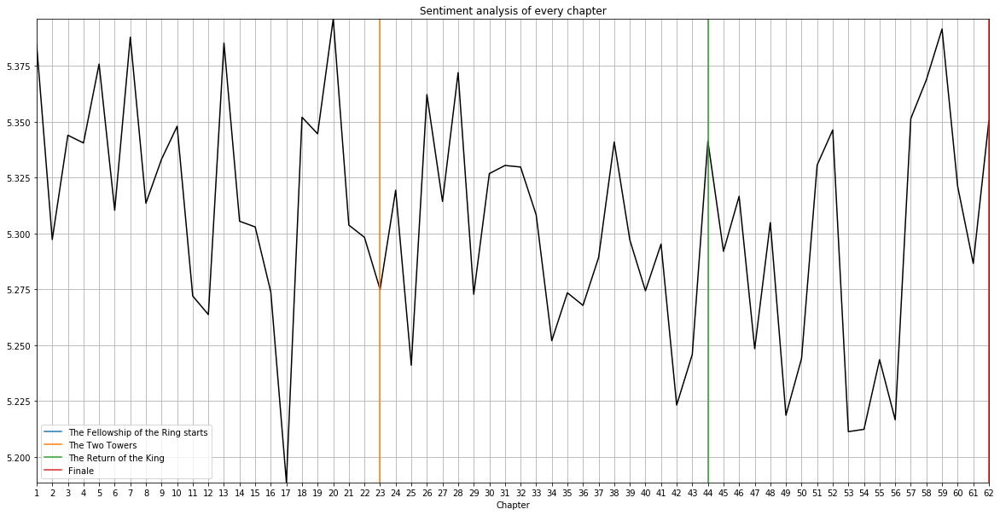

In [68]:
#sentspre, _, _ = sentimentCalculator(LOTR1_prologue_chapters)
sents11, _, _ = sentimentCalculator(LOTR1_book1_chapters)
sents12, _, _ = sentimentCalculator(LOTR1_book2_chapters)
sents21, _, _ = sentimentCalculator(LOTR2_book1_chapters)
sents22, _, _ = sentimentCalculator(LOTR2_book2_chapters)
sents31, _, _ = sentimentCalculator(LOTR3_book1_chapters)
sents32, _, _ = sentimentCalculator(LOTR3_book2_chapters)


all_sents =sents11+sents12+sents21+sents22+sents31+sents32
#plt.show()

#senti = list(reversed(sentimentscores1))
l = range(1, 63)
plt.figure(figsize=(20,10))
plt.plot(l, all_sents, '-', color='black')
plt.plot((0, 0), (min(all_sents), max(all_sents)), '-', label='The Fellowship of the Ring starts')
plt.plot((23, 23), (min(all_sents), max(all_sents)), '-', label='The Two Towers')
plt.plot((44, 44), (min(all_sents), max(all_sents)), '-', label='The Return of the King')
plt.plot((62, 62), (min(all_sents), max(all_sents)), '-', label='Finale')
plt.xticks(l)
plt.xlim(1, 62)
plt.ylim(min(all_sents), max(all_sents))
plt.grid(True)
plt.legend()
plt.xlabel('Chapter')
plt.title("Sentiment analysis of every chapter")
plt.show()

### Text analysis: The movies


In [69]:
# -*- coding: utf-8 -*-
import math 
import pandas as pd

df_script = pd.read_csv("./lotr_scripts.csv")

def split_in_three_movie(dataframe):
    list_lotr1 = []
    list_lotr2 = []
    list_lotr3 = []
    for row in dataframe.iterrows():
        movie = row[1].movie
        name_split = row[1].char.split()
        name = ""
        for element in name_split:
            if element in ['VOICE', 'VOICEOVER', 'OVER','SHOUT']:
                continue
            else:
                name += element + " "   
        name = name.rstrip()
        if "The Fellowship of the Ring" in movie:
            list_lotr1.append((name, row[1].dialog))
        elif "The Two Towers" in movie:
            list_lotr2.append((name, row[1].dialog))
        elif "The Return of the King" in movie:
            list_lotr3.append((name, row[1].dialog))
    return list_lotr1,list_lotr2,list_lotr3

def create_dict_for_dialogues(list_of_dialogues):
    unique_names = []
    for element in list_of_dialogues:
        if element[0] not in unique_names:
            unique_names.append(element[0])
    dict_of_dialogues = {}
    for name in unique_names:
        dict_of_dialogues[name] = ""
    for element in list_of_dialogues:
        if not(type(element[1]) is float):
            dict_of_dialogues[element[0]] = dict_of_dialogues[element[0]] + element[1]+ ". "
    return dict_of_dialogues

def create_files_for_characters_dialogues(folder_name, dict_name):
    for name, dialogues in dict_name.items():
        filename = folder_name + "/" + name + '.txt'
        f = io.open(filename,'w')
        f.write(unicode(dialogues))
        f.close
    return True

def generate_dialog_file(filename, dest_directory):
    dialogue = get_dialogues_for_movie_V2(filename)
    dialogue_cleaned = clean_dialogues_list(dialogue)
    lotr_dict = create_dict_for_dialogues(dialogue_cleaned)
    create_files_for_characters_dialogues(dest_directory, lotr_dict)
    return True


In [70]:
LOTR1_list,LOTR2_list,LOTR3_list =  split_in_three_movie(df_script)

dict1 = create_dict_for_dialogues(LOTR1_list)
dict2 = create_dict_for_dialogues(LOTR2_list)
dict3 = create_dict_for_dialogues(LOTR3_list)

In [71]:
characters = list(df_script.char.unique())

In [72]:
listi1 = []
for key, value in dict1.iteritems():
    listi1.append({"Name" : key,
                  "Text for sentiment" : remove_special_characters_sent(dict1[key]),
                  "Sentiment value" : calcSentiment(word_tokenize(remove_special_characters_sent(dict1[key])),wordrank),
                  "Text for TFIDF" : remove_special_characters(dict1[key]),
                  "Words spoken" : len(word_tokenize(remove_special_characters(dict1[key]))),
                  "Original" : dict1[key]})


listi2 = []
for key, value in dict2.iteritems():
    listi2.append({"Name" : key,
                  "Text for sentiment" : remove_special_characters_sent(dict2[key]),
                  "Sentiment value" : calcSentiment(word_tokenize(remove_special_characters_sent(dict2[key])),wordrank),
                  "Text for TFIDF" : remove_special_characters(dict2[key]),
                  "Words spoken" : len(word_tokenize(remove_special_characters(dict2[key])))})

listi3 = []
for key, value in dict3.iteritems():
    listi3.append({"Name" : key,
                  "Text for sentiment" : remove_special_characters_sent(dict3[key]),
                  "Sentiment value" : calcSentiment(word_tokenize(remove_special_characters_sent(dict3[key])),wordrank),
                  "Text for TFIDF" : remove_special_characters(dict3[key]),
                  "Words spoken" : len(word_tokenize(remove_special_characters(dict3[key])))})

In [73]:
def listcreater(listi,index1,index2):
    newlist = []
    for item in listi:
        name = item[index1] 
        value = item[index2]
        temp = [name, value]
        newlist.append(temp)
        newlist_sorted = sorted(newlist, key=lambda k: k[1],reverse=True)
    return newlist_sorted
    
LOTR1_wordsspoken = listcreater(listi1,'Name','Words spoken')
LOTR2_wordsspoken = listcreater(listi2,'Name','Words spoken')
LOTR3_wordsspoken = listcreater(listi3,'Name','Words spoken')
LOTR1_sentiment = listcreater(listi1,'Name','Sentiment value')
LOTR2_sentiment = listcreater(listi2,'Name','Sentiment value')
LOTR3_sentiment = listcreater(listi3,'Name','Sentiment value')

LOTR3_wordsspoken.pop(47)
LOTR1_sentiment.pop(32)
LOTR1_sentiment.pop(32)
LOTR3_sentiment.pop(1)
LOTR3_sentiment.pop(46)
LOTR3_wordsspoken.pop(44)

['EYE OF SAURON', 2]

In [74]:
#All the information gathered above we want to get into a nice pandas dictionary.
def dict_maker(Movie1,Movie2,Movie3,Movie4,Movie5,Movie6,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8):
    new_dict = {}

    for name in characters:
        temp1 = 0
        temp2 = 0
        temp3 = 0
        temp4 = 0
        temp5 = 0
        temp6 = 0
        for item in Movie1:
            if item[0] in name:
                temp1 = item[1]
                break
        for item in Movie2:
            if item[0] in name:
                temp2 = item[1]
                break
        for item in Movie3:
            if item[0] in name:
                temp3 = item[1]
                break
        for item in Movie4:
            if item[0] in name:
                temp4 = item[1]
                break
        for item in Movie5:
            if item[0] in name:
                temp5 = item[1]
                break
        for item in Movie6:
            if item[0] in name:
                temp6 = item[1]
                break
        temp7 = (temp1*temp4+temp2*temp5+temp3*temp6)/(temp1+temp2+temp3)
        new_dict[name] = {
            Col1 : temp1,
            Col2 : temp2,
            Col3 : temp3,
            Col4 : temp1+temp2+temp3,
            Col5 : temp4,
            Col6 : temp5,
            Col7 : temp6,
            Col8 : (temp7)}
        
    All_data = pd.DataFrame(new_dict).T 
    return All_data

All_data = dict_maker(LOTR1_wordsspoken,LOTR2_wordsspoken,LOTR3_wordsspoken,LOTR1_sentiment,LOTR2_sentiment,LOTR3_sentiment,'Words_LOTR1','Words_LOTR2','Words_LOTR3','Total_words','Sent_LOTR1','Sent_LOTR2', 'Sent_LOTR3','Avg_sent')


In [75]:
#Here we split the dataframe into two, depending on if we are plotting words or sentiments.
All_data = All_data.drop(All_data.index[71])
Many_words = All_data[All_data.Total_words >= 50]
Many_words = Many_words.sort_values('Total_words',ascending=False)
Sentiment_data = Many_words.sort_values('Avg_sent',ascending=False)
Sentiment_all = Sentiment_data[Sentiment_data.Words_LOTR1 > 1]
Sentiment_all = Sentiment_all[Sentiment_all.Words_LOTR2 > 1]
Sentiment_all = Sentiment_all[Sentiment_all.Words_LOTR3 > 1]
Sentiment_all.sort_values('Avg_sent',ascending=False)

,Avg_sent,Sent_LOTR1,Sent_LOTR2,Sent_LOTR3,Total_words,Words_LOTR1,Words_LOTR2,Words_LOTR3
MERRY,5.397923,5.396646,5.371561,5.423923,504.0,108.0,194.0,202.0
PIPPIN,5.394768,5.449333,5.394218,5.377332,621.0,107.0,185.0,329.0
ARWEN,5.381316,5.316159,5.493239,5.347921,208.0,97.0,69.0,42.0
GIMLI,5.355746,5.379799,5.332181,5.372797,545.0,123.0,250.0,172.0
ARAGORN,5.354094,5.319366,5.317481,5.414145,771.0,104.0,377.0,290.0
FRODO,5.338525,5.342888,5.362485,5.313077,867.0,223.0,312.0,332.0
SARUMAN,5.318290,5.222500,5.265024,5.410720,329.0,47.0,148.0,134.0
GALADRIEL,5.314861,5.308965,5.101250,5.477097,270.0,227.0,15.0,28.0
SAM,5.305620,5.243357,5.345826,5.273384,1112.0,109.0,540.0,463.0
ELROND,5.294400,5.265697,5.362238,5.256927,322.0,91.0,107.0,124.0


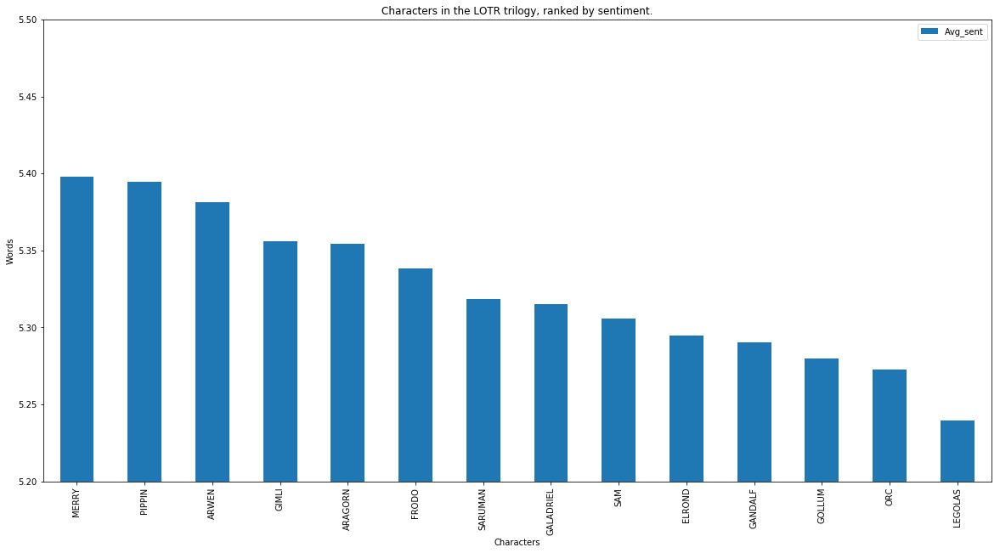

In [76]:
#Plotting the characters by how many words they say in the movie
Sentiment_all.drop(['Sent_LOTR1','Sent_LOTR2', 'Sent_LOTR3','Total_words','Words_LOTR1','Words_LOTR2', 'Words_LOTR3','Total_words'], axis=1).plot.bar(figsize=(20,10))
plt.title('Characters in the LOTR trilogy, ranked by sentiment.')
plt.xlabel('Characters')
plt.ylabel('Words')
plt.ylim(5.2,5.5)
plt.show()

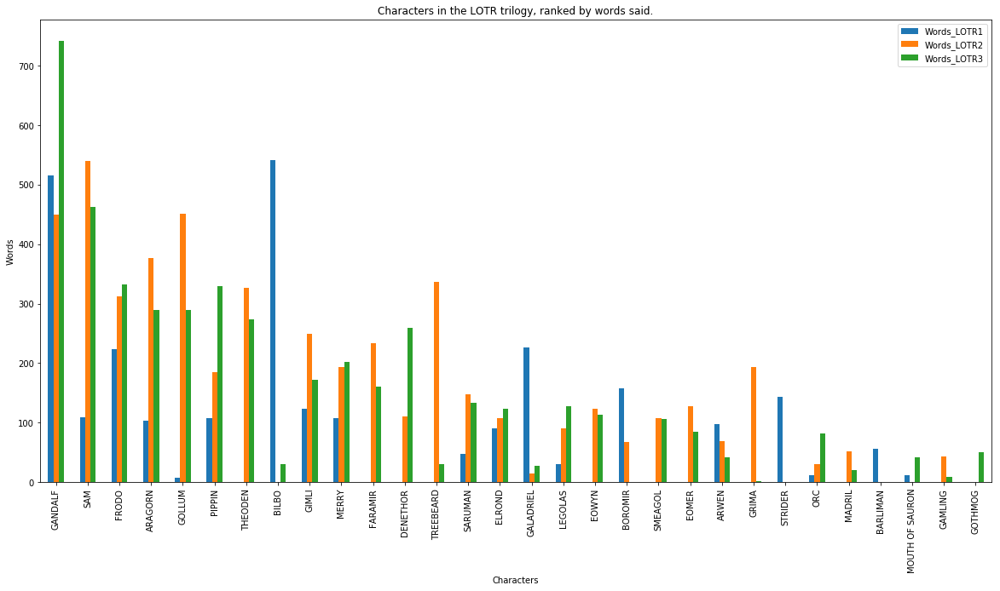

In [77]:
#Plotting the characters by how many words they say in the movie
Many_words.drop(['Sent_LOTR1','Sent_LOTR2', 'Sent_LOTR3','Total_words','Avg_sent'], axis=1).plot.bar(figsize=(20,10))
plt.title('Characters in the LOTR trilogy, ranked by words said.')
plt.xlabel('Characters')
plt.ylabel('Words')
plt.show()

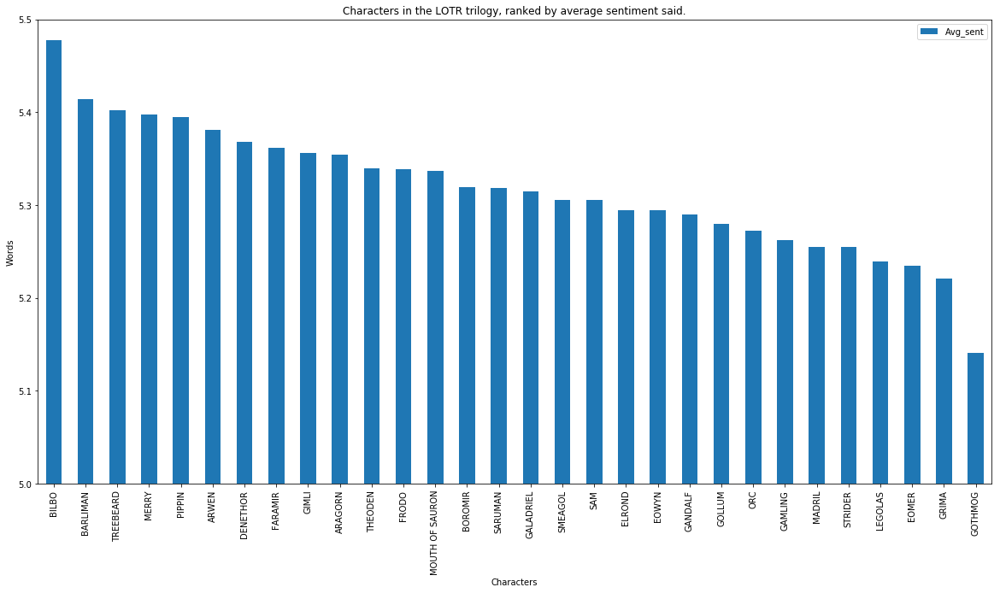

In [78]:
#Plotting a graph of the sentiment in the movies
Sentiment_data.drop(['Sent_LOTR1','Sent_LOTR2', 'Sent_LOTR3','Total_words','Words_LOTR1','Words_LOTR2', 'Words_LOTR3','Total_words'], axis=1).plot.bar(figsize=(20,10))
plt.title('Characters in the LOTR trilogy, ranked by average sentiment said.')
plt.xlabel('Characters')
plt.ylabel('Words')
plt.ylim(5,5.5)
plt.show()

In [79]:
#Creating a dataframe for each movie
SentimentMovie1 = Sentiment_data[Sentiment_data.Words_LOTR1 >= 25]
SentimentMovie1 = SentimentMovie1.sort_values('Sent_LOTR1',ascending=False)
SentimentMovie2 = Sentiment_data[Sentiment_data.Words_LOTR2 >= 25]
SentimentMovie2 = SentimentMovie2.sort_values('Sent_LOTR2',ascending=False)
SentimentMovie3 = Sentiment_data[Sentiment_data.Words_LOTR3 >= 25]
SentimentMovie3 = SentimentMovie3.sort_values('Sent_LOTR3',ascending=False)


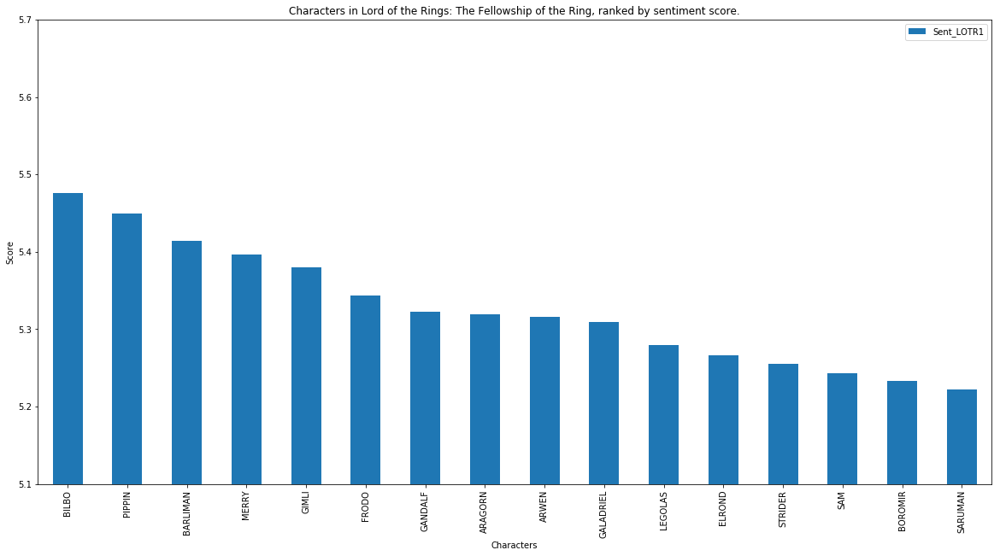

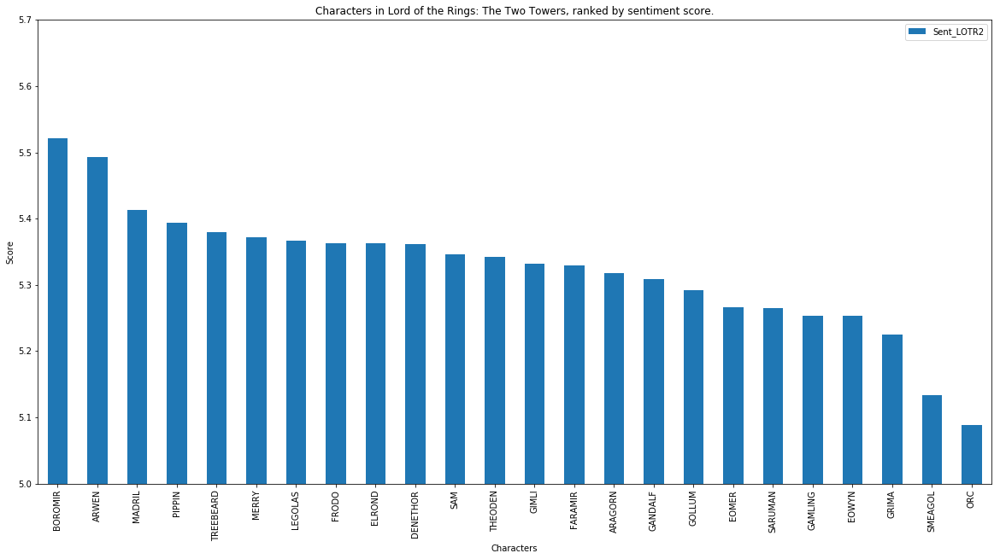

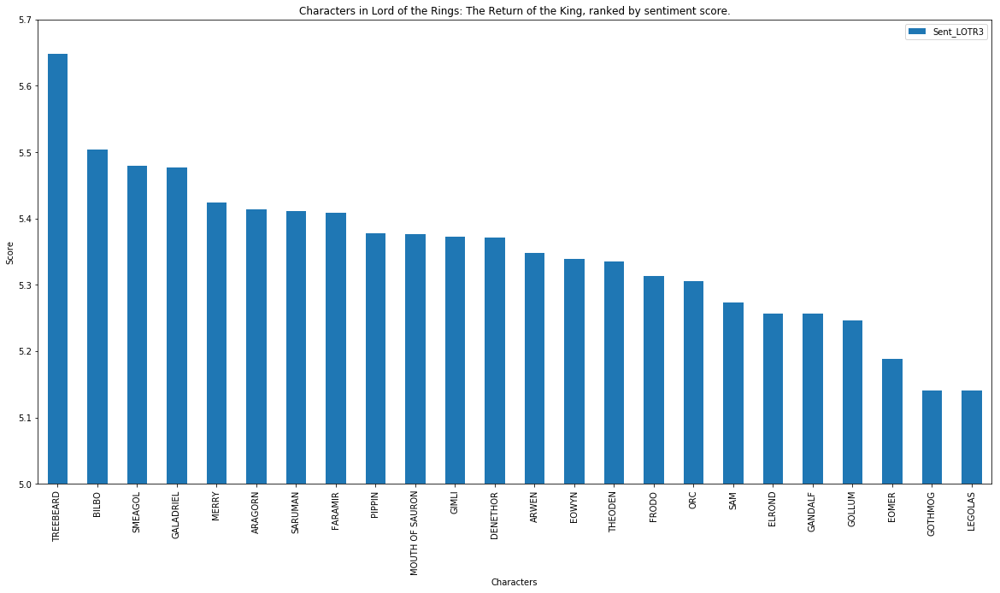

In [80]:
#Maybe make this as a function
SentimentMovie1.drop(['Avg_sent','Total_words','Words_LOTR1','Words_LOTR2','Words_LOTR3','Sent_LOTR2','Sent_LOTR3'], axis=1).plot.bar(figsize=(20,10))
plt.title('Characters in Lord of the Rings: The Fellowship of the Ring, ranked by sentiment score.')
plt.xlabel('Characters')
plt.ylabel('Score')
plt.ylim(5.1,5.7)
plt.show()


SentimentMovie2.drop(['Avg_sent','Total_words','Words_LOTR1','Words_LOTR2','Words_LOTR3','Sent_LOTR1','Sent_LOTR3'], axis=1).plot.bar(figsize=(20,10))
plt.title('Characters in Lord of the Rings: The Two Towers, ranked by sentiment score.')
plt.xlabel('Characters')
plt.ylabel('Score')
plt.ylim(5,5.7)
plt.show()

SentimentMovie3.drop(['Avg_sent','Total_words','Words_LOTR1','Words_LOTR2','Words_LOTR3','Sent_LOTR1','Sent_LOTR2'], axis=1).plot.bar(figsize=(20,10))
plt.title('Characters in Lord of the Rings: The Return of the King, ranked by sentiment score.')
plt.xlabel('Characters')
plt.ylabel('Score')
plt.ylim(5,5.7)
plt.show()


Of course, we created some wordclouds for the characters in the movie. Note that, due to most of them not saying close to as many words as are in the books, TF-IDF was deemed unnessecary. Appropriate images were selected to represent the characters.

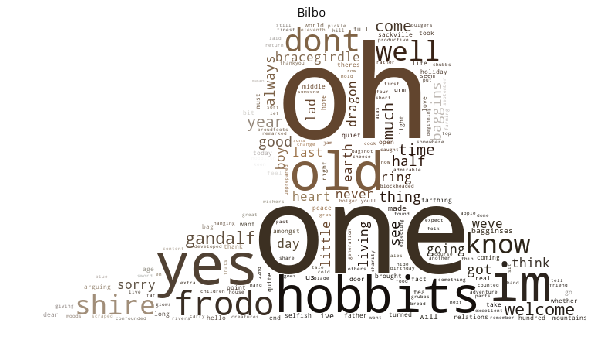

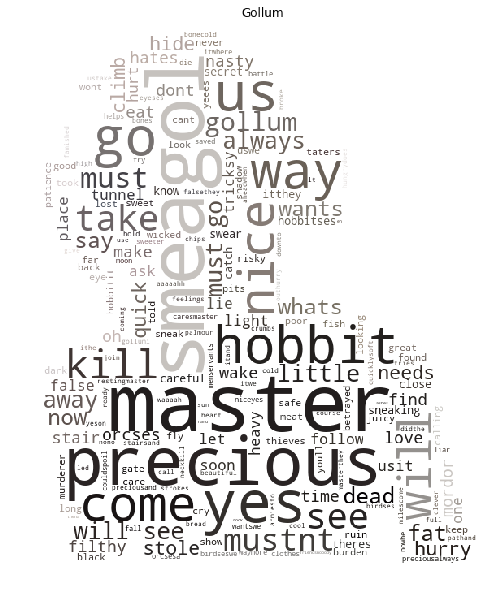

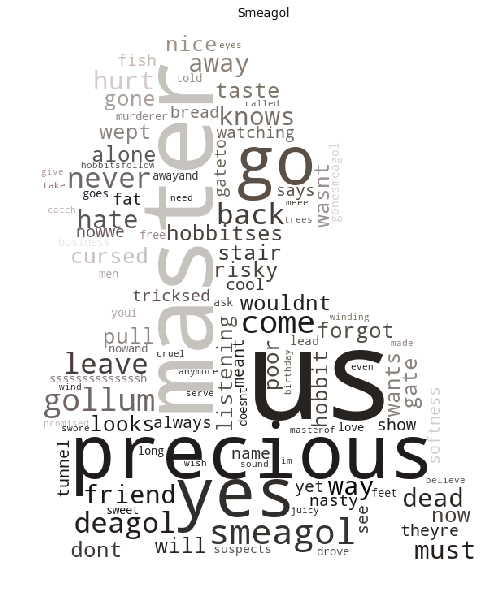

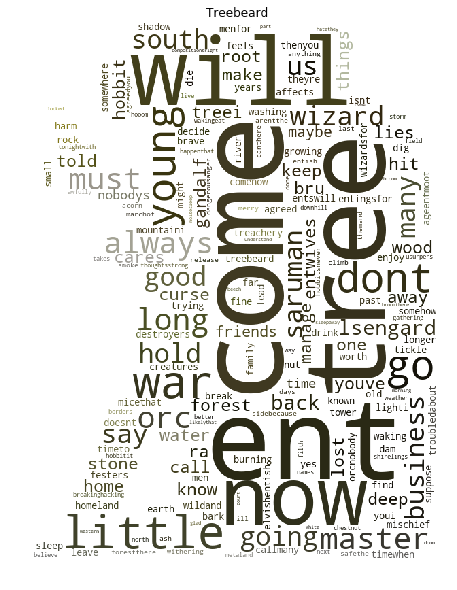

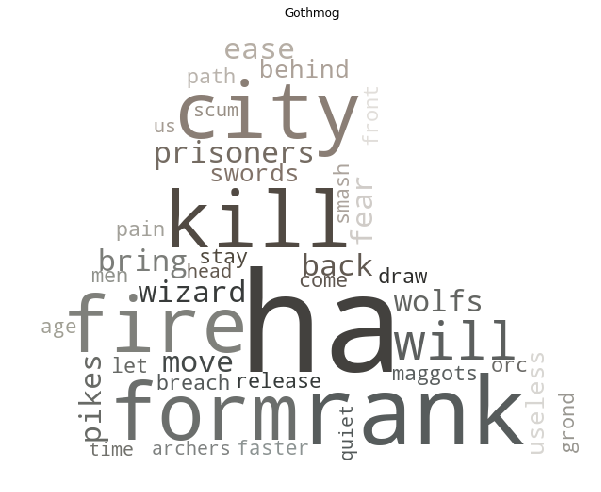

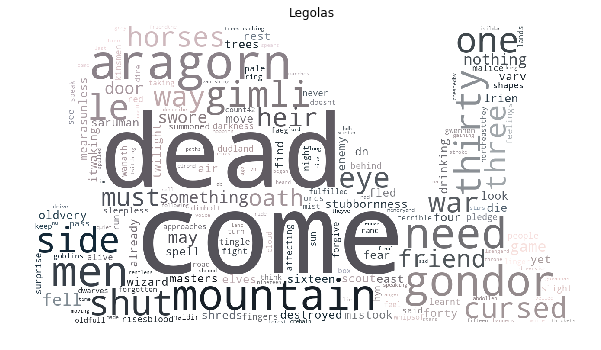

In [82]:
#Wordcloud for Bilbo movie 1
result_Bilbo = (dict1['BILBO'].replace('\xc2\xa0','')+dict3['BILBO'].replace('\xc2\xa0',''))
generateWordcloud(remove_special_characters_sent(result_Bilbo),'Bilbo',"./images/CoAgB.jpg")


#result_Gollum = generateWordcloudStringCharacters(TFIDF_Gollum)
result_Gollum= dict1['GOLLUM'].replace('\xc2\xa0','')+dict2['GOLLUM'].replace('\xc2\xa0','')+dict3['GOLLUM'].replace('\xc2\xa0','')
generateWordcloud(remove_special_characters_sent(result_Gollum),'Gollum',"./images/gollum.jpg")

#Smeagol
result_Smeagol= dict2['SMEAGOL'].replace('\xc2\xa0','')+dict3['SMEAGOL'].replace('\xc2\xa0','')
generateWordcloud(remove_special_characters_sent(result_Smeagol),'Smeagol',"./images/gollum.jpg")

#Treebeard
result_Treebeard = dict2['TREEBEARD'].replace('\xc2\xa0','')+dict3['TREEBEARD'].replace('\xc2\xa0','')
generateWordcloud(remove_special_characters_sent(result_Treebeard),'Treebeard',"./images/treebeard.jpg")

#Treebeard
result_Gothmog = dict3['GOTHMOG'].replace('\xc2\xa0','')
#TFIDF_Gothmog = TFIDF_generator(sent_tokenize(dict3['GOTHMOG'].replace('\xc2\xa0','')))
#result_Gothmog = generateWordcloudStringCharactersCharacter(TFIDF_Gothmog)
generateWordcloud(remove_special_characters_sent(result_Gothmog),'Gothmog',"./images/gothmog.png")

#Legolas
result_Legolas = dict1['LEGOLAS'].replace('\xc2\xa0','')+dict2['LEGOLAS'].replace('\xc2\xa0','')+dict3['LEGOLAS'].replace('\xc2\xa0','')
generateWordcloud(remove_special_characters_sent(result_Legolas),'Legolas',"./images/legolas.jpg")

Last but not least, a lexical dispersion plot was made for the characters present in the movie who spoke more than 50 words. The results are quite expected, with the members of the fellowship being mentioned all throughout the books.

In [85]:
import sys
reload(sys)
sys.setdefaultencoding('utf8')

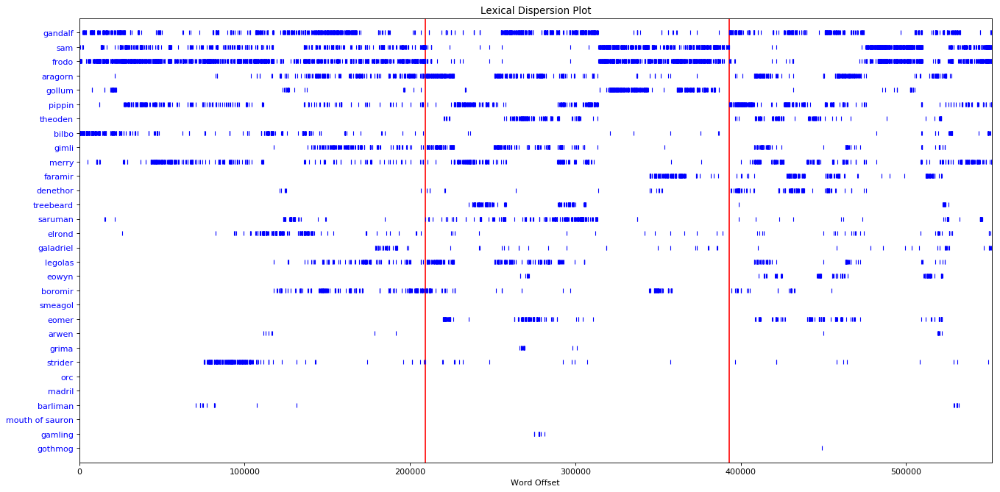

In [86]:
All_books = ["".join(LOTR1_book1_chapters+LOTR1_book2_chapters),"".join(LOTR2_book1_chapters+LOTR2_book2_chapters),"".join(LOTR3_book1_chapters+LOTR3_book2_chapters)]

nltktexts = [ nltk.Text(nltk.word_tokenize(t.lower()))  for t in All_books]
allbooks =  nltk.Text(nltk.word_tokenize(
                ' '.join([t.lower() for t in All_books])
            ))  
chars = [x.lower() for x in list(Many_words.index)]
fdist_books = nltk.FreqDist(allbooks.tokens)

#filteredcharacters = [c.lower() for c in allcharacters if fdist_books[c.lower()] > 100]



plt.figure(num=4, figsize=(20, 10), dpi=80)
plt.vlines(len(nltktexts[0]), -1, len(chars), 'r')
plt.vlines(len(nltktexts[0]) + 1 + len(nltktexts[1]), -1, len(chars), 'r')
plt.xlim( 0,  len(nltktexts[0]) + 1 + len(nltktexts[1]) +  len(nltktexts[2])  )
allbooks.dispersion_plot(chars)

## Discussion
- What went well?,
- What is still missing? What could be improved?, Why?